In [32]:
import numpy as np

In [33]:
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

matplotlib.rcParams['figure.figsize'] = (15.0, 15.0)

In [34]:
import pickle

#### Guillaume Desforges
#### Pierre-François Villard

# Introduction

Le but de ce TP est de mettre en oeuvre l'estimation de densité et l'algorithme des K plus proches voisins.

## Données

Dans ce TP nous aurons pour données les positions GPS de lieux correspondants à différents types de *Point of Interest* (POI) ainsi que les positions GPS de stations Vélib'.

In [35]:
poi_data = pickle.load(open("poi-paris.pkl","rb"))
poi_types = list(poi_data.keys())

In [36]:
print("Les types de POI :")
for poi_type in poi_types:
    print(" - {}".format(poi_type))

Les types de POI :
 - atm
 - furniture_store
 - clothing_store
 - bakery
 - convenience_store
 - night_club
 - cafe
 - restaurant
 - bar
 - lodging
 - laundry
 - home_goods_store


In [37]:
def get_poi_gps(poi_type):
    mat = np.array(list(map(lambda x: x[0], poi_data[poi_type].values())))
    mat[:, [0, 1]] = mat[:, [1, 0]] 
    return mat

In [38]:
with np.load("velib-enpc.npz") as obj:
    stations = dict(obj['stations'].tolist())
    # correspondance id velib -> ligne matrice
    stations_idx = dict(obj['stations_idx'].tolist())
    # correspondance ligne matrice -> id velib
    idx_stations = dict(obj['idx_stations'].tolist())
    # matrice du nombre de velos dispo par station par minute
    stations_freebikes = obj['histo']
    # positions GPS des stations
    stations_gps = np.array([[station[6], station[5]] for station in stations.values()])

## Visualisation des données

On met en place différentes fonctions pour pouvoir visualiser nos données :

In [39]:
paris_map = mpimg.imread('./paris-48.806-2.23--48.916-2.48.png')
#On a utilisé une image png pour des raisons de compatibilité
# coordonées GPS des bordures de l'image
x_min, x_max = 2.23, 2.48
y_min, y_max = 48.806, 48.916

In [40]:
def set_map_background():
    plt.xlim(x_min, x_max)
    plt.ylim(y_min, y_max)
    plt.imshow(paris_map, extent=[x_min, x_max, y_min, y_max], aspect=1.5)

In [41]:
def show_gps(gps, color='red', alpha=0.8, size=0.8):
    plt.scatter(gps[:, 0], gps[:, 1], alpha=alpha, s=size, color=color)

In [42]:
def show_histogram(histogram, colorbar=False):
    plt.imshow(histogram, extent=[x_min, x_max, y_min, y_max], interpolation='none', alpha=0.3, origin="lower", aspect=1.5)
    if colorbar:
        plt.colorbar()

Exemple de visualisation pour un type de point d'intérêts :

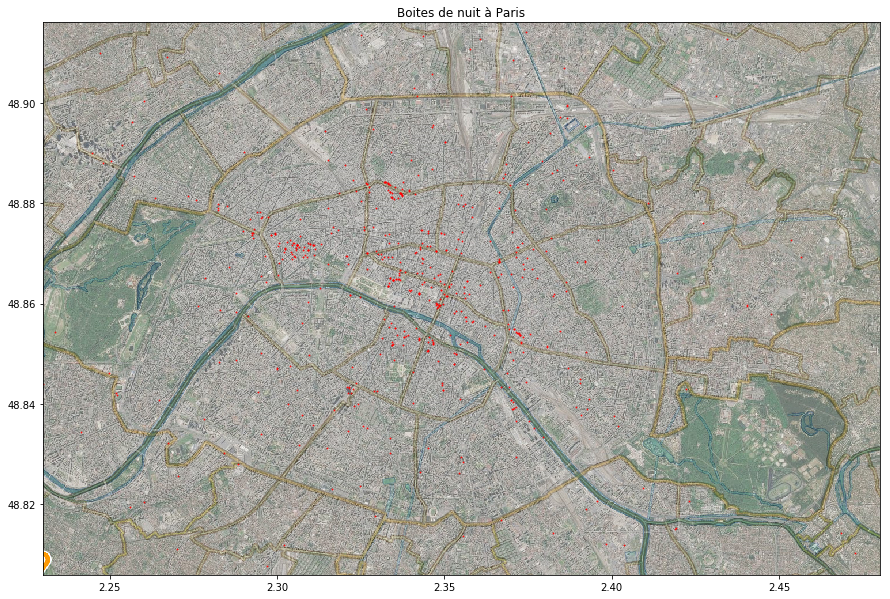

In [43]:
set_map_background()
plt.title("Boites de nuit à Paris")
show_gps(get_poi_gps('night_club'))

Exemple de visualisation pour un histogramme :

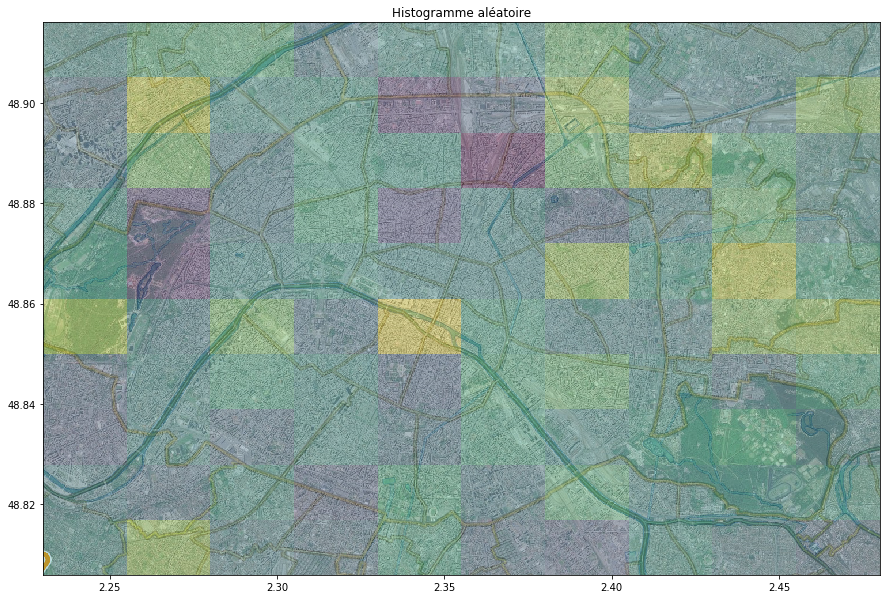

In [44]:
set_map_background()
plt.title("Histogramme aléatoire")
show_histogram(np.random.randn(10, 10))

# 1. Estimation de densité

L’objectif de cette partie est d’estimer la densité spatiale d’un certain type de POI sur le territoire parisien, notée $p_s(x, y)$ avec $(x, y)$ la longitude et latitude. Nous allons pour cela étudier deux méthodes : la méthode des histogrammes et les fenêtres de Parzen.

## 1.1. Méthode des histogrammes

L’objectif de la méthode des histogrammes est de calculer une densité constante par morceaux reflétant la répartition de l’échantillon. Pour cela, une discrétisation de l’espace en hypercube est considérée et la densité est estimée à partir du comptage du nombre d’exemples tombant dans chaque hypercube rapporté au nombre total d’exemples multipié par le volulme de l’hypercube. Il est possible de pondérer les exemples par des poids.

On récupère les données GPS des cafés de Paris.

In [45]:
cafe_gps = get_poi_gps('cafe')

On affiche ces positions sur la carte.

Text(0.5,1,'Géolocalisation des cafés à Paris')

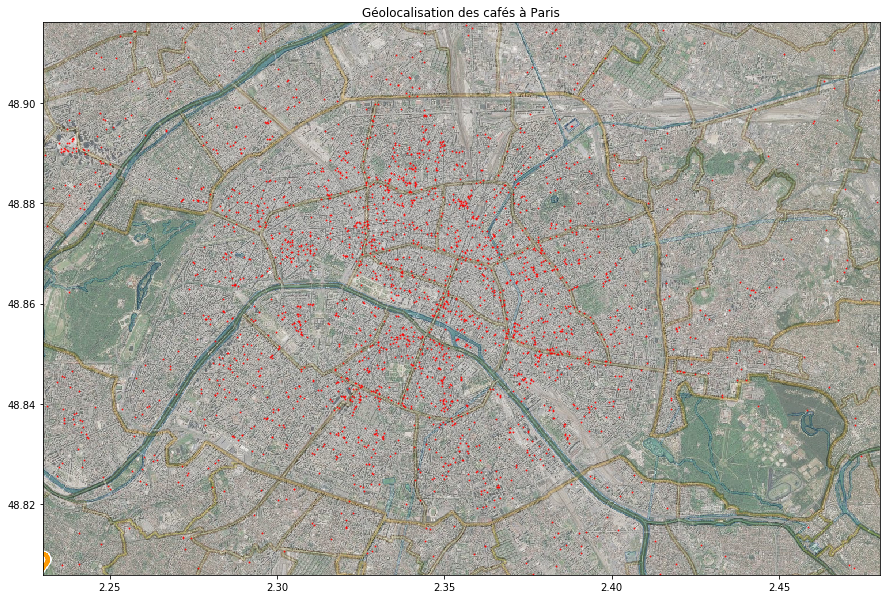

In [46]:
set_map_background()
show_gps(cafe_gps)
plt.title("Géolocalisation des cafés à Paris")

Grâce à ces données GPS, on peut calculer la densité par la méthode des histogrammes.

In [47]:
def estimate_histogram_density(gps, gridsize=10):
    histogram = np.zeros((gridsize, gridsize))
    for [x_gps, y_gps] in gps:
        x_grid = int((x_gps - x_min)*gridsize/(x_max - x_min))
        y_grid = int((y_gps - y_min)*gridsize/(y_max - y_min))
        histogram[y_grid, x_grid] += 1
    return histogram

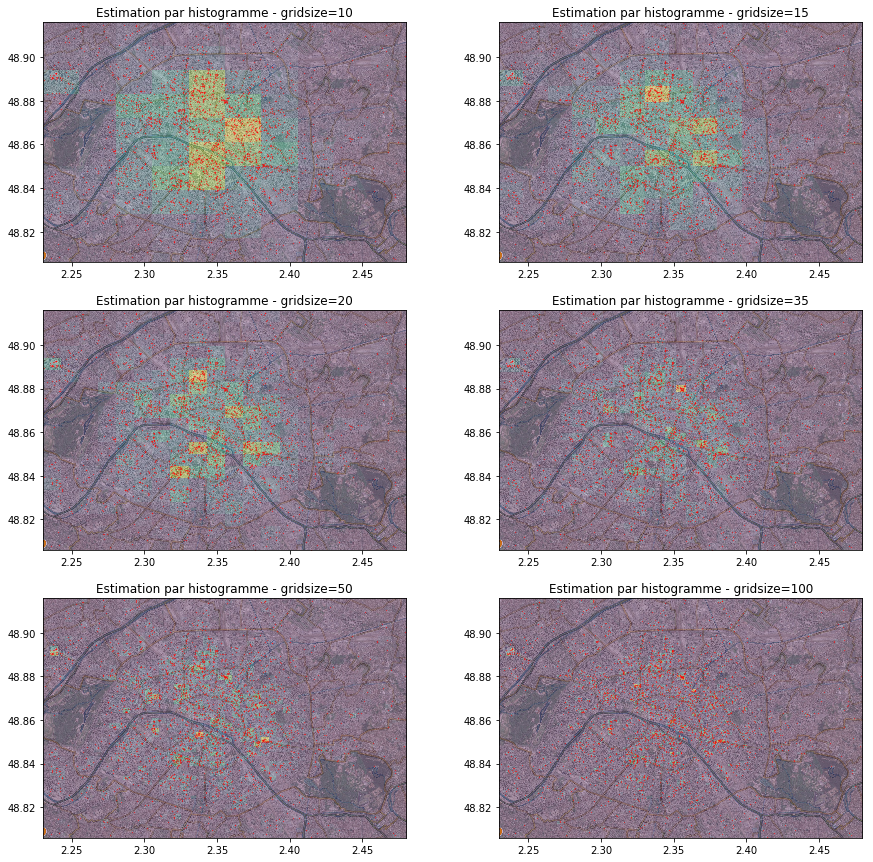

In [48]:
for i, gridsize in enumerate([10, 15, 20, 35, 50, 100]):
    plt.subplot(3, 2, i+1)
    plt.title("Estimation par histogramme - gridsize={}".format(gridsize))
    set_map_background()
    show_gps(cafe_gps, size=0.1)
    cafe_histogram = estimate_histogram_density(cafe_gps, gridsize=gridsize)
    show_histogram(cafe_histogram)

Les zones les plus denses semblent se déplacer quand on modifie la finesse de la grille mais ce phénomène s'estompe lorsque la grille devient assez grande, les résultats ne sont donc pas stables au début mais convergent néanmoins. Le nombre modèle dépend de la résolution de la grille et de la résolution, On a $resolution^{dimension}$ paramètres (la taille de la carte n'influe pas en soi, elle modifie seulement l'échelle).

Quand on augmente d'une dimension, le nombre de paramètres est multiplié par la résolution de la grille, quand on change la resolution, l'évolution est polynomiale.
La méthode a l'avantage d'être simple et de conserver la "masse", en intégrant sur la carte on retrouve le bon nombre de POI total mais elle n'ets pas très stable en basse dimension, ce qui force à adopter un maillage plus fin pas toujours adapté à des recueils de données pas assez fournis où on se retrouve avec beaucoup de cases vides.

## 1.2. Fenêtres de Parzen

Les fenêtres de Parzen permettent d’éliminer les effets de bord de la méthode des histogrammes : une fenêtre (un hypercube) centrée autour du point à estimer est utilisée plutôt que des hypercubes statiques. L’estimation est calculée en comptant le nombre de points présents dans la fenêtre, possiblement pondéré en utilisant un noyau en fonction de la distance au centre de la fenêtre, centre qui correspond au point à estimer.

On définit des fonctions construisant des fenêtres.

In [49]:
def uni(x, data, sigma):
    data_scaled_centered = np.abs(data-x) / sigma
    amax = np.amax(data_scaled_centered, axis=1)
    v = np.where(amax <= 0.5, np.ones(len(data_scaled_centered)), np.zeros(len(data)))
    return v

In [50]:
def gaussian(x, data, sigma):
    data_scaled_centered = np.abs(data-x)/sigma
    d = data.shape[1]
    v = np.exp(-np.linalg.norm(data_scaled_centered, axis=1)**2 / 2) / ((2*np.pi)**(d/2)) 
    return v

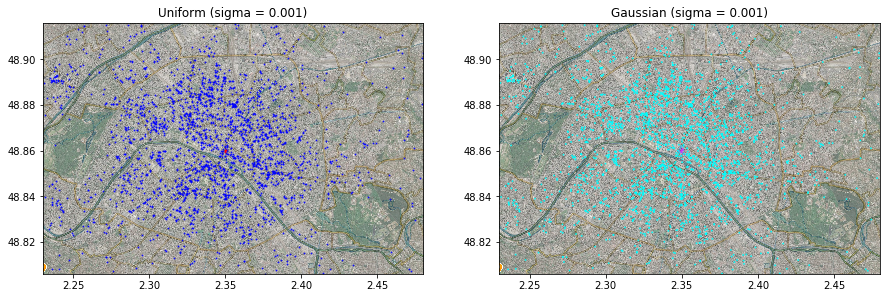

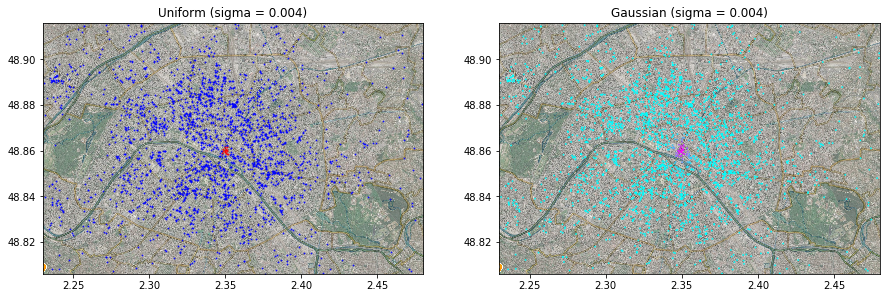

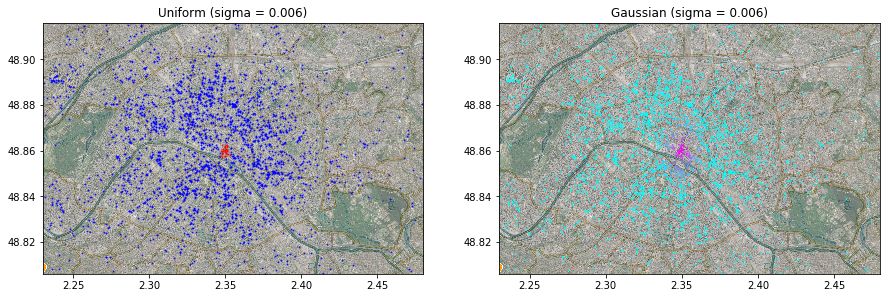

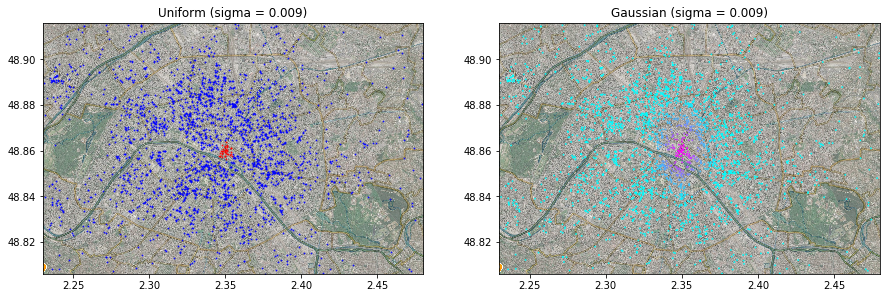

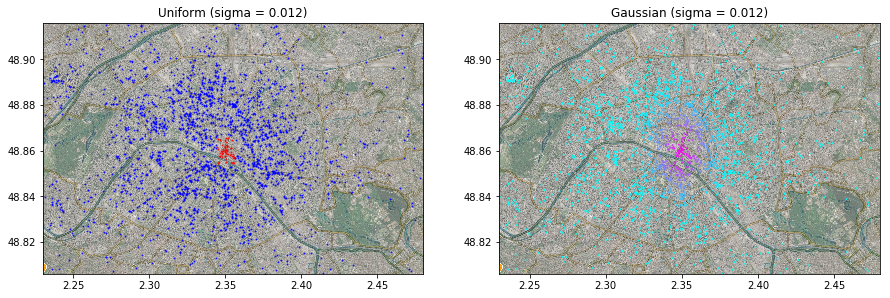

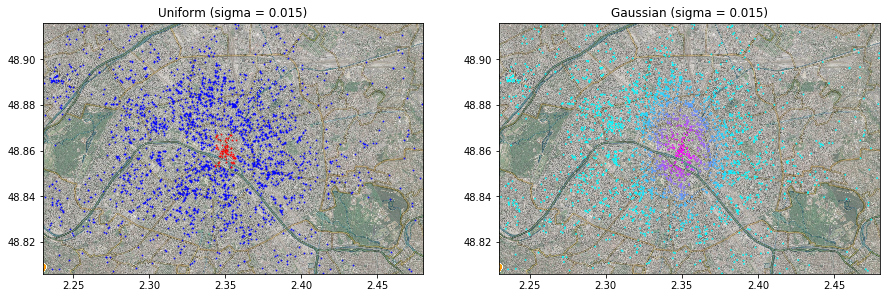

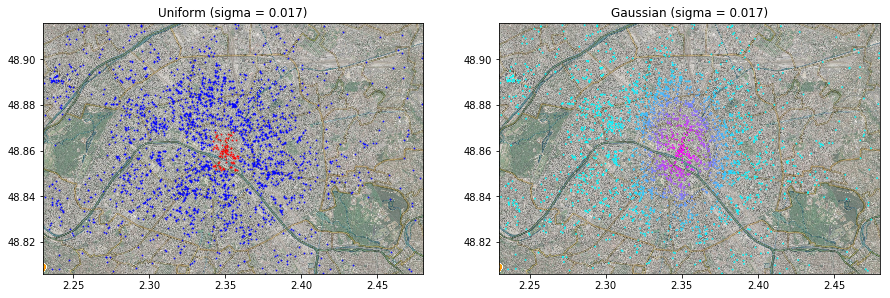

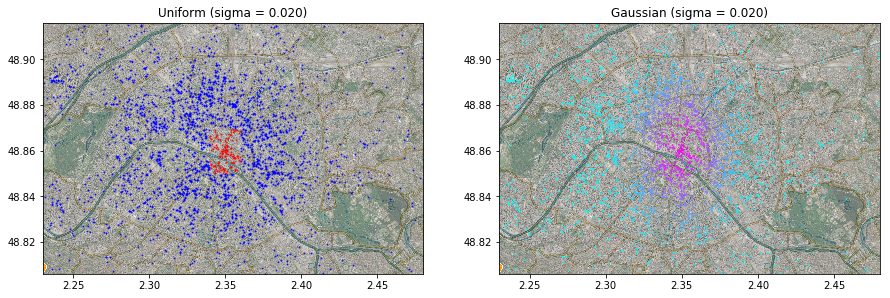

In [51]:
x_test = [2.35, 48.86]

for sigma in np.linspace(0.001, 0.02, 8):
    # uni
    kerneluni = uni(x_test, cafe_gps, sigma)
    
    plt.subplot(1, 2, 1)
    plt.title("Uniform (sigma = {:.3f})".format(sigma))
    set_map_background()
    show_gps(cafe_gps[kerneluni == 0], color='blue')
    show_gps(cafe_gps[kerneluni == 1], color='red')
    
    # gaussian
    kernelgauss = gaussian(x_test, cafe_gps, sigma)
    
    plt.subplot(1, 2, 2)
    plt.title("Gaussian (sigma = {:.3f})".format(sigma))
    set_map_background()
    color = np.ones((len(kernelgauss), 3))
    color[:,0] = kernelgauss/np.max(kernelgauss)
    color[:,1] = 1 - kernelgauss/np.max(kernelgauss)
    show_gps(cafe_gps, color=color)
    plt.show()

Les tailles de la fenêtre augmente avec $\sigma$.

On implémente maintenant l'algorithme des fenêtres de Parzen.

In [52]:
def parzen(x, data, weight, sigma, kernel):
    kernel_v = kernel(x, data, sigma) * weight
    parzen_density = sum(kernel_v) / sum(weight) / float(sigma)
    return parzen_density

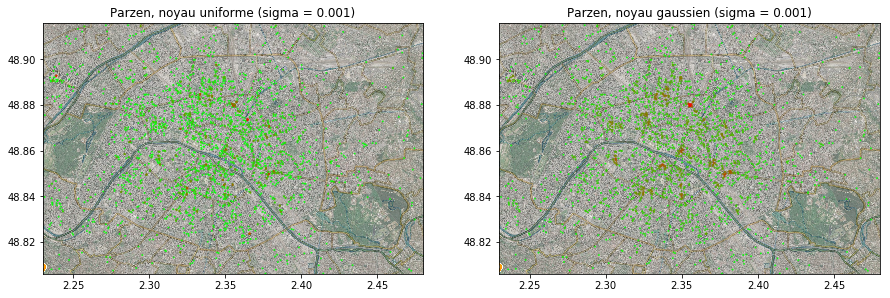

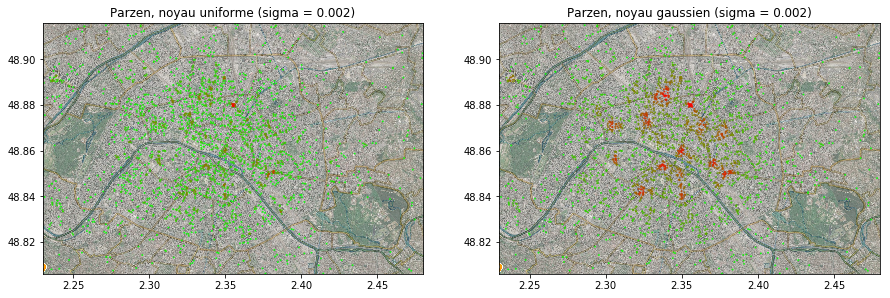

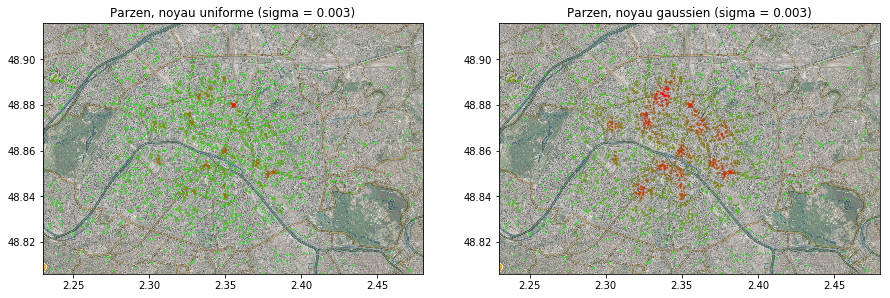

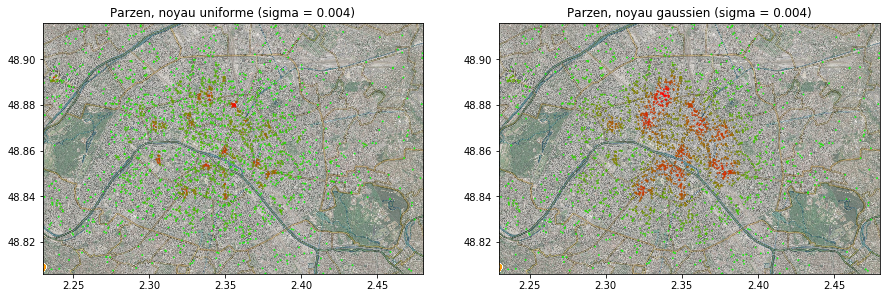

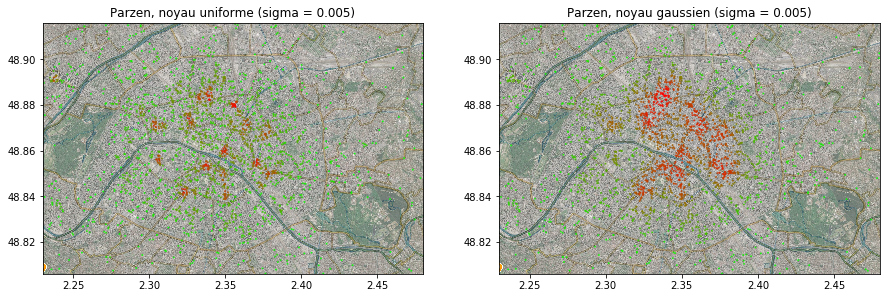

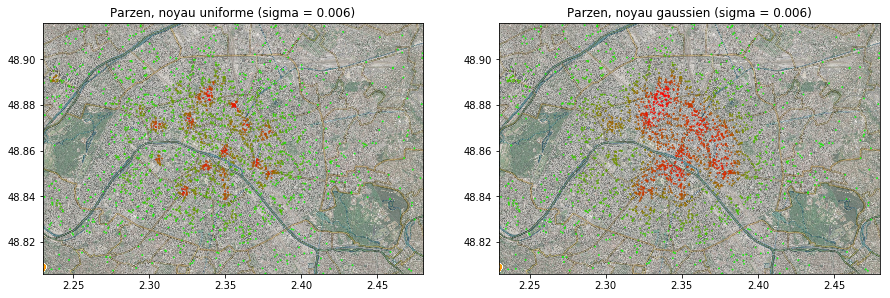

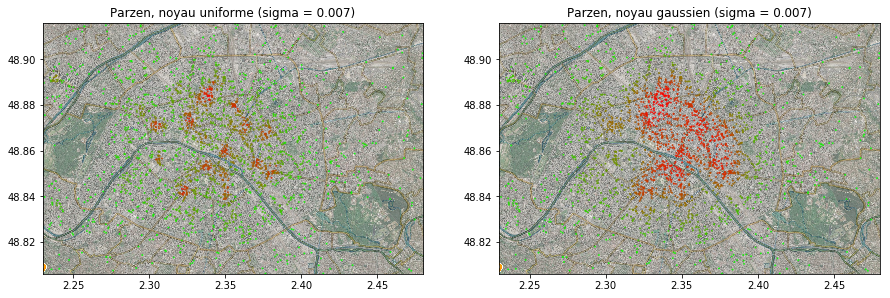

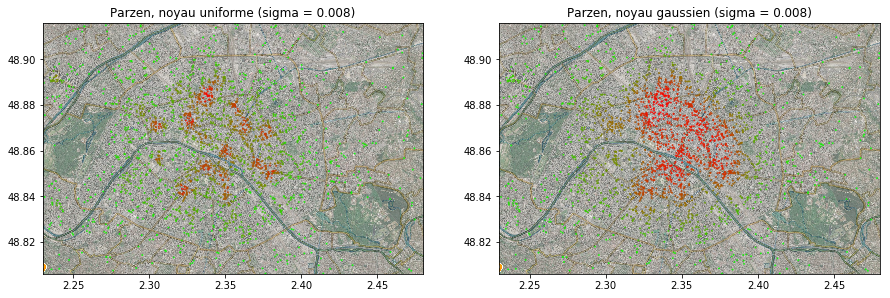

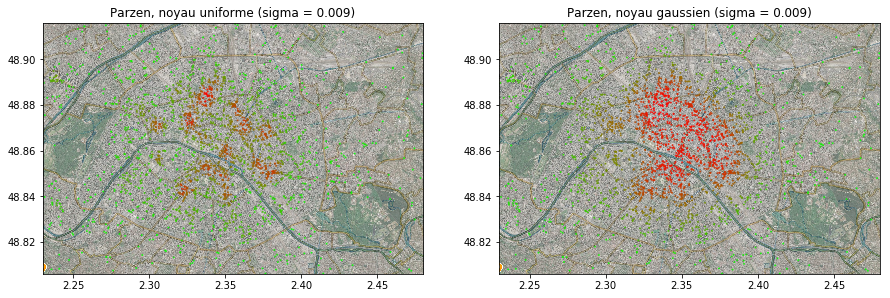

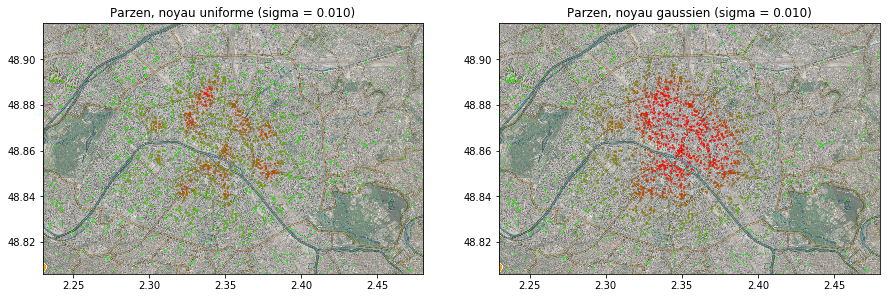

In [53]:
for sigma in np.linspace(0.001, 0.01, 10):
    # uni
    parzen_uni = np.array([parzen(gps, cafe_gps, np.ones(cafe_gps.shape[0]), sigma, uni) for gps in cafe_gps])
    parzen_uni_normalized = (parzen_uni-parzen_uni.min())/(parzen_uni.max()-parzen_uni.min())
    parzen_uni_colors = [[d, 1-d, 0] for d in parzen_uni_normalized]
    
    plt.subplot(1, 2, 1)
    plt.title("Parzen, noyau uniforme (sigma = {:.3f})".format(sigma))
    set_map_background()
    show_gps(cafe_gps, color=parzen_uni_colors)
    
    # gaussian
    parzen_gaussian = np.array([parzen(gps, cafe_gps, np.ones(cafe_gps.shape[0]), sigma, gaussian) for gps in cafe_gps])
    parzen_gaussian_normalized = (parzen_gaussian-parzen_gaussian.min())/(parzen_gaussian.max()-parzen_gaussian.min())
    parzen_gaussian_colors = [[d, 1-d, 0] for d in parzen_gaussian_normalized]
    
    plt.subplot(1, 2, 2)
    plt.title("Parzen, noyau gaussien (sigma = {:.3f})".format(sigma))
    set_map_background()
    show_gps(cafe_gps, color=parzen_gaussian_colors)
    
    plt.show()

On obtient le même genre de résulats que précédemment. On voit que pour un point donné, la densité estimée en ce point augmente avec $\sigma$.

En effet, pour le noyau gaussien chaque point gagnera en influence et pour le noyau uniforme de plus en plus de point seront captés par la fenêtre.. 

On voit que lorsque $\sigma$ tend vers 0 (resp. $+\infty$) les deux densités tendent vers 0 (resp. 1).

Le contraste semble ici être meilleur quand $\sigma$ est égal à 0.01 (resp. 0.005) pour le noyau uniforme (resp. le noyau gaussien).

Les moindres carrés sont difficiles à utiliser pour évaluer l'estimation car elle converge bien plus lentement (en $O(n^{-\frac{4}{5}})$) que d'autres algorithmes (généralement en $O(n^{-1})$).

# 2. Nadaraya-Watson

L’estimateur de Nadaraya-Watson permet d’adapter les fenêtres de Parzen à la régression locale.

Dans les questions suivantes, on veut modéliser le nombre de vélibs empruntés en fonction du temps à une station précisée pour une journée donnée.

On visualise d'abord l'évolution du nombre de vélos disponibles à chaque minute pour quelques station :

In [54]:
time_max = 7*24*60

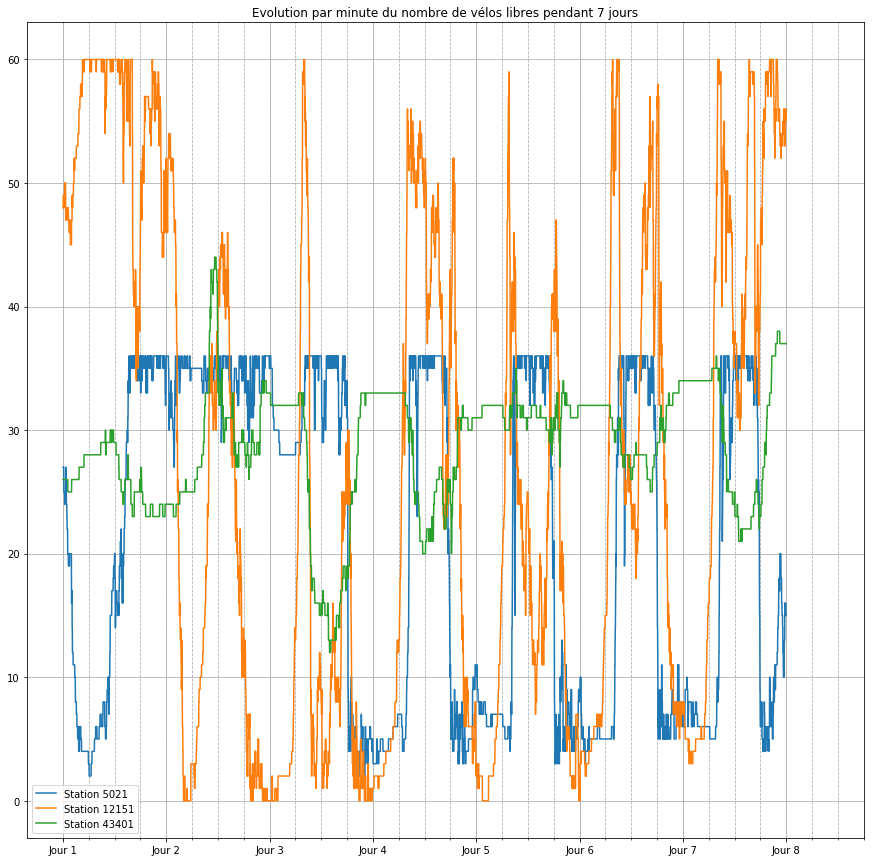

In [55]:
plt.title("Evolution par minute du nombre de vélos libres pendant 7 jours")
for i, idx in map(lambda x: (stations_idx[x], x), [5021, 12151, 43401]):
    plt.plot(stations_freebikes[i, :time_max], label='Station {}'.format(idx))
plt.legend()
plt.xticks([j*24*60 for j in range(8)], ['Jour {}'.format(i+1) for i in range(8)])
plt.gca().set_xticks([h*60 for h in range(0, 8*24, 6)], minor=True)
plt.grid(which='major', linestyle='-')
plt.grid(which='minor', linestyle='--')

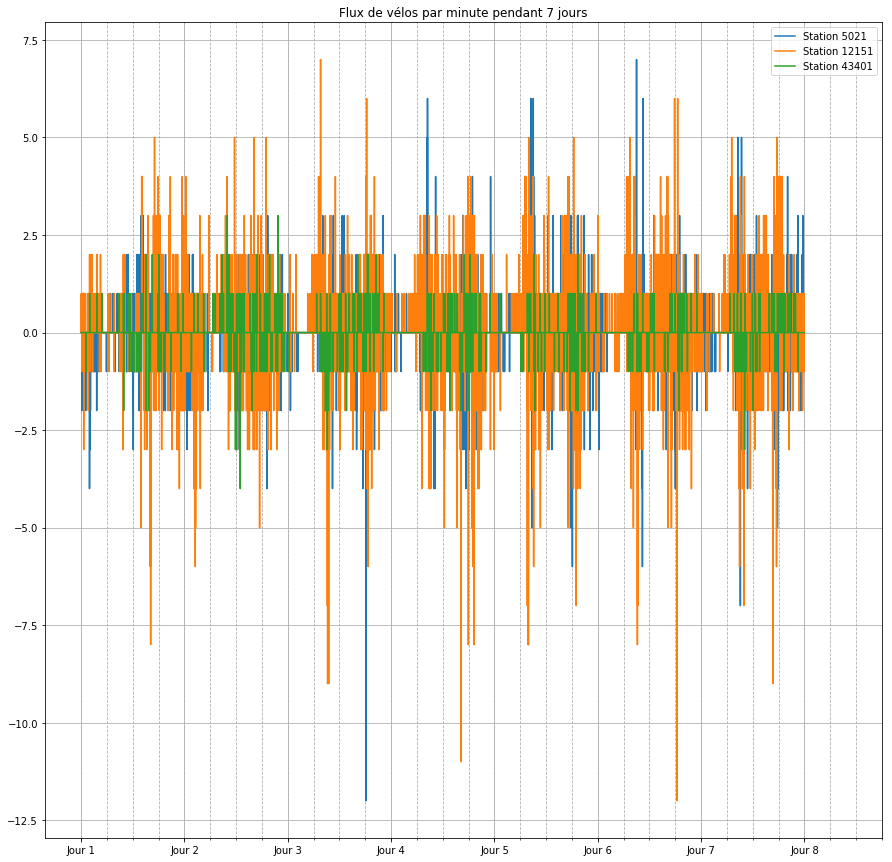

In [56]:
plt.title("Flux de vélos par minute pendant 7 jours")
for i, idx in map(lambda x: (stations_idx[x], x), [5021, 12151, 43401]):
    station_flux = stations_freebikes[i, 1:time_max+1]-stations_freebikes[i, :time_max]
    plt.plot(station_flux, label='Station {}'.format(idx))
plt.legend()
plt.xticks([j*24*60 for j in range(8)], ['Jour {}'.format(i+1) for i in range(8)])
plt.gca().set_xticks([h*60 for h in range(0, 8*24, 6)], minor=True)
plt.grid(which='major', linestyle='-')
plt.grid(which='minor', linestyle='--')

On voit que la station 12 151 a beaucoup de traffic, atteignant un maximum de 60 vélos libres et le minimum de 0 vélos libres, en oscillant rapidement.

La station 5 021 oscille entre 3 et 35 vélos sur un rythme similaire.

La station 43 401 oscille quand à elle entre 10 et 37.

On implémente l'estimateur de Nadaraya-Watson.

In [57]:
def nadaraya_estimate(station_gps, sigma, kernel):
    kernel_v = kernel(station_gps, stations_gps, sigma)
    nadaraya_estimation = np.dot(stations_freebikes.transpose(), kernel_v) / kernel_v.sum()
    return nadaraya_estimation

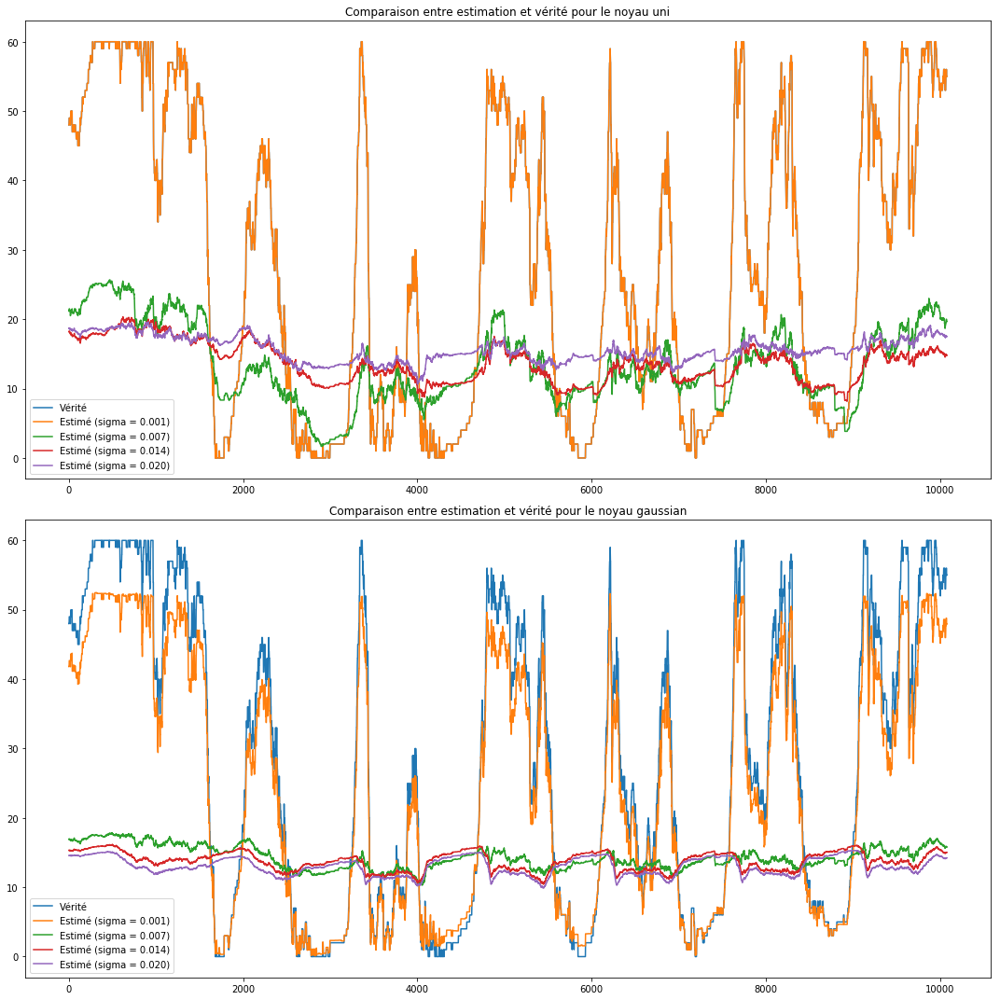

In [58]:
station_i = stations_idx[12151]
station_gps = stations_gps[station_i]

for i, kernel in enumerate([uni, gaussian]):
    plt.subplot(2, 1, i+1)
    plt.title("Comparaison entre estimation et vérité pour le noyau {}".format(kernel.__name__))
    plt.plot(stations_freebikes[station_i, :time_max], label="Vérité")
    for sigma in np.linspace(0.001, 0.02, 4):
        estimated = nadaraya_estimate(station_gps, sigma, kernel)
        plt.plot(estimated[:time_max], label="Estimé (sigma = {:.3f})".format(sigma))
    plt.legend()
    
plt.tight_layout()
plt.show()

On voit tout d'abord que comme attendu, plus sigma est grand plus le modèle colle à la réalité. En effet, comme on est placé sur un des points du set de données, on va tendre vers la valeur d'entrée. Le cas le plus flagrant est pour le noyau uniforme : Le seul noyau dont la valeur est 1 est celui de la station étudiée, tous les autres étant nuls, on retombe sur la valeur d'entrée.

# 3. K plus proches voisins



Il faut maintenant recommencer la démarche précédente en enlevant la station étudiée des données que l'on fournit à la fonction nadaray_estimate afin de se placer dans des conditions réelles. 

C:\Users\pierr\Miniconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until


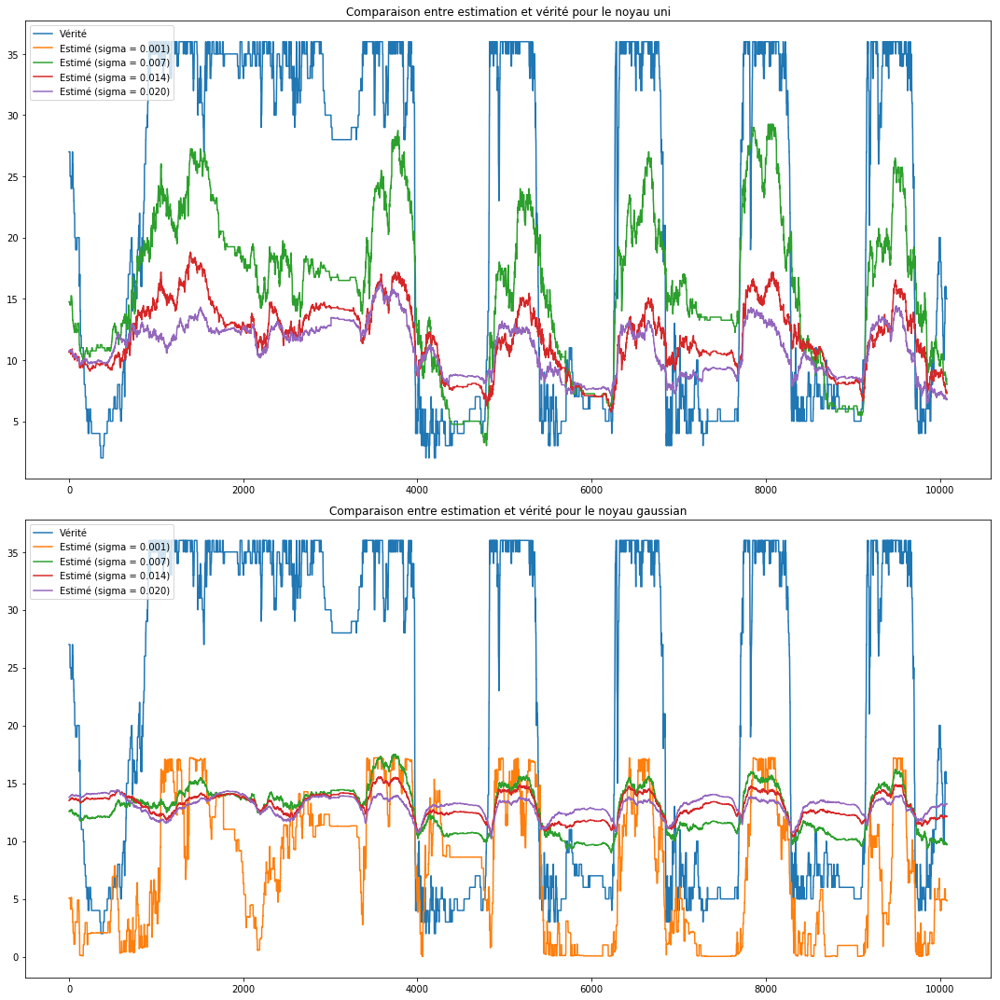

In [59]:
station_i = stations_idx[5021]
station_gps = stations_gps[station_i]


original_freebikes = stations_freebikes[station_i, :time_max]

stations_gps = np.delete(stations_gps, station_i, 0)
stations_freebikes = np.delete(stations_freebikes, station_i, 0)



for i, kernel in enumerate([uni, gaussian]):
    plt.subplot(2, 1, i+1)
    plt.title("Comparaison entre estimation et vérité pour le noyau {}".format(kernel.__name__))
    plt.plot(original_freebikes, label="Vérité")
    for sigma in np.linspace(0.001, 0.02, 4):
        
        estimated = nadaraya_estimate(station_gps, sigma, kernel)
        plt.plot(estimated[:time_max], label="Estimé (sigma = {:.3f})".format(sigma))
    plt.legend()
    
plt.tight_layout()
plt.show()


#On restaure les données
with np.load("velib-enpc.npz") as obj:
    stations = dict(obj['stations'].tolist())
    # correspondance id velib -> ligne matrice
    stations_idx = dict(obj['stations_idx'].tolist())
    # correspondance ligne matrice -> id velib
    idx_stations = dict(obj['idx_stations'].tolist())
    # matrice du nombre de velos dispo par station par minute
    stations_freebikes = obj['histo']
    # positions GPS des stations
    stations_gps = np.array([[station[6], station[5]] for station in stations.values()])

On constate d'abord sur le noyau uniforme que l'estimation pour le sigma le plus bas, lem odèle n'est pas affiché ; en effet comme sigma est trop petit, aucun noyau n'est positif au point étudié et on essaie donc de diviser par zéro dans le modèle ce qui l'empêche de se réaliser. On voit néanmoins pour les autres valeurs de sigma un biais important pour les deux noyaux, la valeur réelle est bien au dessus des prévisions proposées par le modèle, la station est peut-être trop différente de ses voisines. On remarque enfin que des valeurs trop élevées de sigma faussent totalement le modèle en le rendant quasiment constant (tous les noyaux ont alors des valeurs très similaires).

Dans une région désertique, les noyaux les plus proche auront une valeur très faible et ne se distingueront plus assez des autres stations, la valeur résultant du modèle ne sera alors plus assez spécifique.


In [71]:

def K_voisins(station_gps, k, kernel):
    deltas=stations_gps-station_gps
    distances=np.dot(deltas,deltas.transpose()).diagonal()
    minimums_idx=distances.argsort()[:k]
    nadaraya_estimation = stations_freebikes[minimums_idx].sum(0) / k
    return nadaraya_estimation


[ 9.8  9.8  9.8 ...,  7.2  7.2  7.2]
40320


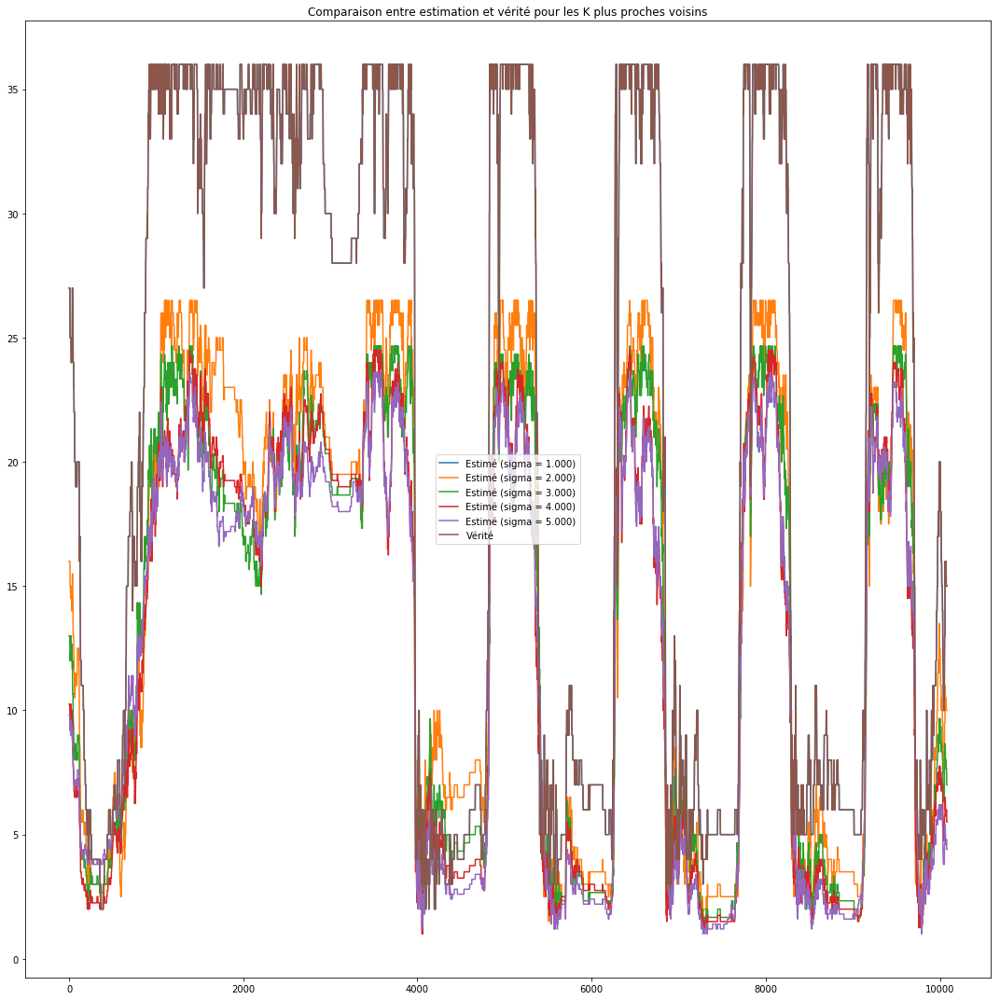

In [80]:
station_i = stations_idx[5021]
station_gps = stations_gps[station_i]

plt.title("Comparaison entre estimation et vérité pour les K plus proches voisins")
for K in range(1,6):
    estimated = K_voisins(station_gps, K, kernel)
    plt.plot(estimated[:time_max], label="Estimé (sigma = {:.3f})".format(K))
plt.plot(stations_freebikes[station_i, :time_max], label="Vérité")
plt.legend()
    
plt.tight_layout()
plt.show()

La méthode donne un résultat assez satisfaisant pour les périodes où les stocks de vélibs sont bas dans la station 5021. Beaucoup plus fidèle que les méthodes précédentes. Pour les périodes hautes cependant, on observe un biais du même genre qu'avec la méthode précédente même si il semble moins prononcé. On observe par ailleurs que outre le biais, les variations relatives du niveau de stock estimé en période haute est assez semblable entre la réalité et l'estimation des K plus proches voisins.